# Frequency-Domain Diffusion with Circulant Matrices

## Overview

This notebook explores the `CirculantSymmetricMatrixDiffusionProcess` class in depth and demonstrates how to design diffusion processes directly in the frequency domain. We recommend reading `vp_vs_ve.ipynb` first to understand the core concepts of diffusion models. We also recommend reading `vp_vs_freq.ipynb` to see how the same class can impose spatial structure on the forward process — in that notebook the process was defined via the first row of a circulant symmetric matrix, whereas here we work directly with the eigenvalues of that matrix.

## The Cosine Eigenbasis

A circulant symmetric matrix can be diagonalized by the Fourier matrix, and its eigenvalues equal the Fourier transform of its first row. Since we prefer real-valued representations, we diagonalize using the discrete cosine basis, which shares the same eigenvalues as the Fourier basis for symmetric matrices.

The eigenvector matrix **Q** has the following form:
$$
\begin{align*}
&\bm{Q} = \begin{bmatrix}
\frac{1}{\sqrt{M}} & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 0 \cdot 1\right) & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 0 \cdot 2\right) & \dots & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 0 \cdot (M-1)\right) \\
\frac{1}{\sqrt{M}} & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 1 \cdot 1\right) & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 1 \cdot 2\right) & \dots & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 1 \cdot (M-1)\right) \\
\frac{1}{\sqrt{M}} & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 2 \cdot 1\right) & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 2 \cdot 2\right) & \dots & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot 2 \cdot (M-1)\right) \\
\vdots & \vdots & \vdots & \ddots & \vdots \\
\frac{1}{\sqrt{M}} & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot (M-1) \cdot 1\right) & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot (M-1) \cdot 2\right) & \dots & \sqrt{\frac{2}{M}} \cos\left(\frac{\pi}{M} \cdot (M-1) \cdot (M-1)\right)
\end{bmatrix}
\end{align*}$$

The `CirculantSymmetricMatrixDiffusionProcess` class lets us define a diffusion process by specifying the eigenvalues of the circulant symmetric matrices that control the drift and diffusion terms. We pass a function that receives the diffusion time step and returns half the eigenvalues (the other half is fixed by symmetry) for both the drift and diffusion matrices.

## Experiment Design

In this example, we compare two frequency-selective schedules:

- **High-frequency-first**: higher frequencies decay during $t \in [0, 0.5]$; lower frequencies decay during $t \in [0.5, 1]$.
- **Low-frequency-first**: lower frequencies decay during $t \in [0, 0.5]$; higher frequencies decay during $t \in [0.5, 1]$.

In both processes, each frequency follows a variance-preserving (VP) schedule with a time-warped $\beta(t)$ — effectively running a full VP decay in half the allotted time window. A standard VP process with the same $\beta(t)$ schedule serves as the baseline.

We evaluate both processes on a synthetic signal that is a sum of a low-frequency and a high-frequency cosine wave, then compare the generated samples from all three models.

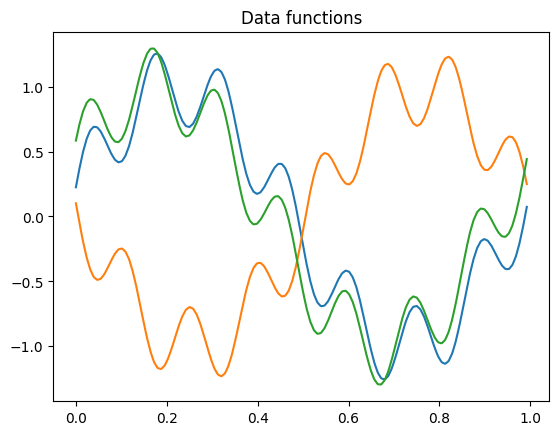

In [1]:

import matplotlib.pyplot as plt
import numpy as np
import torch

from skfda import FDataGrid

seed = 13
random_state = np.random.RandomState(seed=seed)

device = "cpu"

n_samples = 2000
n_points = 128
data_matrix = np.zeros((n_samples, n_points))
grid_points = np.arange(n_points) / n_points

load_trained = True
train = False
save_model = True


frequency_small = 1
frequency_big = 7

phase_range = (0., 2 * np.pi)
phase = random_state.uniform(phase_range[0], phase_range[1], size=(n_samples, 1))

# Implicitly broadcast to (n_samples, n_points)
# Base cosine
data_matrix = np.cos(2 * np.pi * frequency_small * grid_points[np.newaxis, :] + phase)
# Second cosine higher frequency
data_matrix += 0.3 * np.cos(2 * np.pi * frequency_big * grid_points[np.newaxis, :] + phase)

fd = FDataGrid(data_matrix=data_matrix, grid_points=grid_points)


fig, ax = plt.subplots()
fd[:3].plot(axes=ax)
ax.set_title("Data functions")

plt.show()



## Synthetic Dataset

The dataset consists of two superimposed cosine waves sharing the same phase. The low-frequency component has frequency $1$ and constant amplitude $1.0$. The high-frequency component has frequency $7$ and constant amplitude $0.3$. The shared phase $\phi$ is drawn uniformly from $[0, 2\pi]$ for each sample. Each signal is defined on the interval $[0, 1]$ and sampled at $128$ equidistant points.

In [2]:
from skfda.ml.generative import (
    CirculantSymmetricMatrixDiffusionProcess,
)

num_eigen_values = n_points // 2 + 1
# Define the first process
beta_min = .01
beta_max = 15.0
# This number controls the speed of the diffusion
# For each frequency, we scale the time to acelerate or decelerate the process 

# For the first process, we want to accelerate the diffusion 
# for the higher frequencies, so for faster
# for frequencies above the mean of frequency_small and frequency_big, 
# we set a higher beta
freq_mean = (frequency_small + frequency_big) // 2

# For the second process, we want to accelerate the diffusion
# for the lower frequency.

# Linear schedule for the beta values, starting from min_beta to max_beta
# Unsqueeze to make it (1, num_eigen_values) for broadcasting
# with time dimension later
# (1, num_eigen_values)
def beta_high(t):
    t = t.unsqueeze(-1).expand(-1, num_eigen_values)  # (N, 1) -> (N, num_eigen_values)
    mask = torch.ones(num_eigen_values, device=t.device)
    mask[freq_mean:] = 0.
    masked_t = 2 * torch.max(0.5 * mask, t) - mask
    return 2 * (beta_min + (beta_max - beta_min) * masked_t)

def beta_low(t):
    t = t.unsqueeze(-1).expand(-1, num_eigen_values)  # (N, 1) -> (N, num_eigen_values)
    mask = torch.ones(num_eigen_values, device=t.device)
    mask[:freq_mean] = 0.
    masked_t = 2 * torch.max(0.5 * mask, t) - mask
    return 2 * (beta_min + (beta_max - beta_min) * masked_t)

def drift_low_frequency(t):
    return -0.5 * beta_low(t)

def diffusion_low_frequency(t):
    return torch.sqrt(beta_low(t))

def drift_high_frequency(t):
    return -0.5 * beta_high(t)

def diffusion_high_frequency(t):
    return torch.sqrt(beta_high(t))



# (1, M) + (1, M) * (N, 1) -> (N, M)
process_low_fq = CirculantSymmetricMatrixDiffusionProcess(
    drift_term=drift_low_frequency,
    diffusion_term=diffusion_low_frequency,
    fourier_drift=True,
    fourier_diffusion=True,
    seed=seed,
)

process_high_fq = CirculantSymmetricMatrixDiffusionProcess(
    drift_term=drift_high_frequency,
    diffusion_term=diffusion_high_frequency,
    fourier_drift=True,
    fourier_diffusion=True,
    seed=seed,
)

def normal_beta(t):
    t = t.unsqueeze(-1)

    return beta_min + (beta_max - beta_min) * t
def drift_vp(t):
    return -0.5 * normal_beta(t)

def diffusion_vp(t):
    return torch.sqrt(normal_beta(t))

# Ground truth processes
vp_process = CirculantSymmetricMatrixDiffusionProcess(
    drift_term=drift_vp,
    diffusion_term=diffusion_vp,
    fourier_drift=True,
    fourier_diffusion=True,
    seed=seed,
)

## Frequency-Selective Beta Schedules

We classify frequencies as *high* if they lie above the midpoint between the two signal frequencies, and *low* otherwise. The key expression controlling the time-warping is:

```python
    masked_t = 2 * torch.max(0.5 * mask, t) - mask
```

- **`mask = 0` (first frequency group)**: the schedule is active from the start, compressing the VP decay into the $t \in [0, 0.5]$ window via the transformation $2t$.
- **`mask = 1` (second frequency group)**: the schedule is held at zero noise during the first half of the process. The active window $t \in [0.5, 1.0]$ is then mapped to $[0, 1]$ via the time-shifted transformation $2\max(0.5, t) - 1$.

Finally, the entire schedule is multiplied by $2$ so that each frequency group integrates to the same cumulative noise as the standard VP schedule, preserving the signal-to-noise ratio at the end of the forward process:

$$\begin{align*}
&\int_{0}^{1} \beta(t) dt = \int_0^{1} \beta_{min} + (\beta_{max}-\beta_{min}) t\, dt = \frac{\beta_{min} + \beta_{max}}{2} \\
\\
&\int_{0}^{1} \beta^*(t) dt = \begin{cases} 
\int_0^{0.5}2 (\beta_{min} + (\beta_{max} - \beta_{min}) 2 t ) dt  = \frac{\beta_{min} + \beta_{max}}{2}  \quad \quad  \quad\text{if mask = 0}\\
\\
\int_{0.5}^{1} 2 (\beta_{min} + (\beta_{max} - \beta_{min}) (2 t -1)) dt = \frac{\beta_{min} + \beta_{max}}{2} \quad \text{if mask = 1} \\
\end{cases}
\end{align*}$$

In [3]:
# Teach dimensionality of the data to be used, this is usually not
# needed as it is done on the generator.fit() method.
_ = process_low_fq.fit(torch.zeros((1,  n_points), device=device))
_ = process_high_fq.fit(torch.zeros((1, n_points), device=device))
_ = vp_process.fit(torch.zeros((1, n_points), device=device))

## Fitting the Diffusion Processes

We call `.fit()` solely to communicate the data dimensionality to each process. Ordinarily this step is handled automatically inside `FDDiffusionGenerator.fit()`, but since we are using the processes standalone here we must pass the dimensionality explicitly.

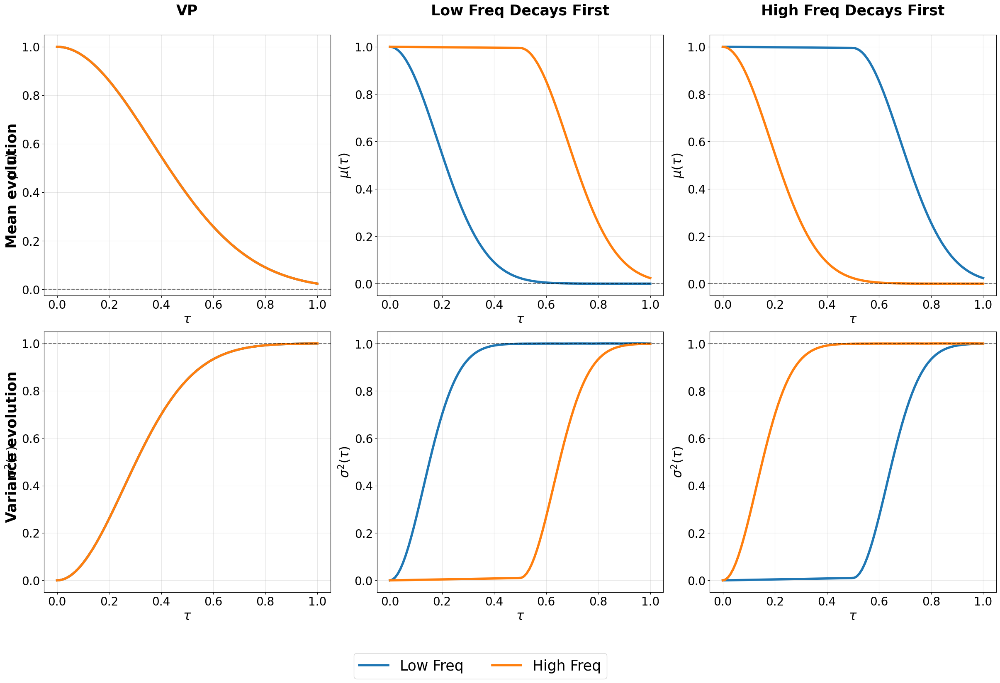

In [4]:
y0 = torch.ones((1, n_points), device=device)  # (1, n_points)
process_names = ["VP", "Low Freq Decays First", "High Freq Decays First"]
colors = plt.cm.viridis(np.linspace(0, 1, num_eigen_values))
fig, axes = plt.subplots(2, 3, figsize=(24, 15), constrained_layout=True)

eigen_values_to_plot = [frequency_small, frequency_big]

for i, process in enumerate([vp_process, process_low_fq, process_high_fq]):
    ax = axes[0, i]
    mean_over_time = []
    t_vals = torch.linspace(
        0., 1., steps=100, requires_grad=False, device=device,
    )

    for t in t_vals:
        mean_at_t = process.diagonal_process_.mean_cond(y0, t)
        mean_over_time.append(mean_at_t.cpu().squeeze(0).numpy())
    mean_over_time = np.array(mean_over_time)  # (n_time_points, n_points)

    for j in eigen_values_to_plot:
        ax.plot(t_vals.cpu().numpy(), mean_over_time[:, j], linewidth=4,
                label="High Freq" if j > freq_mean else "Low Freq")
    ax.axhline(y=0.0, color="black", linestyle="--", alpha=0.5)
    ax.set_xlabel(r"$\tau$", fontsize=22)
    ax.set_ylabel(r"$\mu(\tau)$", fontsize=22)
    ax.set_title(f"{process_names[i]}\n", fontsize=25, fontweight="bold")
    ax.tick_params(axis="both", labelsize=20)

    ax.grid(alpha=0.3)

    ax = axes[1, i]
    sigma_over_time = []
    for t in t_vals:
        cov_at_t = process.diagonal_process_._cov(t.reshape(1))  # noqa: SLF001
        sigma_over_time.append(cov_at_t.cpu().squeeze(0).numpy())
    sigma_over_time = np.array(sigma_over_time)  # (n_time_points, n_points)
    for j in eigen_values_to_plot:
        ax.plot(t_vals.cpu().numpy(), sigma_over_time[:, j], linewidth=4,
                label="High Freq" if j > freq_mean else "Low Freq")
    ax.axhline(y=1.0, color="black", linestyle="--", alpha=0.5)
    ax.set_xlabel(r"$\tau$", fontsize=22)
    ax.set_ylabel(r"$\sigma^2(\tau)$", fontsize=22)
    # Make ticks larger and more visible
    ax.tick_params(axis="both", labelsize=20)
    ax.set_title("") 
    ax.grid(alpha=0.3)

# ── Shared titles ──────────────────────────────────────────────
row0_y = (axes[0, 0].get_position().y0 + axes[0, 0].get_position().y1) / 2
row1_y = (axes[1, 0].get_position().y0 + axes[1, 0].get_position().y1) / 2

fig.text(0.01, row0_y, "Mean evolution",
         va="center", ha="center", fontsize=25, fontweight="bold", rotation=90)
fig.text(0.01, row1_y, "Variance evolution",
         va="center", ha="center", fontsize=25, fontweight="bold", rotation=90)
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels,
           loc="lower center",
           bbox_to_anchor=(0.48, -0.1),
           ncol=2,
           fontsize=25,
           frameon=True)

plt.show()

## Mean and Variance Evolution in the Frequency Domain

The plots above show the evolution of the conditional mean and variance in the frequency domain. The standard VP process (left column) decays all frequencies at the same rate. For the other two processes, the low-frequency component (blue) and the high-frequency component (orange) decay at different rates. In the *Low Frequency Decay First* process, for instance, the blue curve reaches zero by $\tau = 0.5$ while the orange curve remains stationary until the second half of the process — exactly the intended design.

In [5]:
from matplotlib import rc
from matplotlib.animation import FuncAnimation
torch_generator = torch.Generator(device).manual_seed(seed)

n_frames = 25
# Using a non-linear spacing for better visualization of the evolution
# After 0.5 mostly is noise, so we want more frames at the beginning.
torch_time_steps = torch.linspace(0.0, 1.0, n_frames, device=device)
fd_min = fd.data_matrix.min()
fd_max = fd.data_matrix.max()
sample_function = fd[0]
torch_sample = torch.from_numpy(sample_function.data_matrix[..., 0]).float().to(device)
n_points = torch_sample.shape[-1]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

rc("animation", html="jshtml")


process_names = ["VP", "Low Freq", "High Freq"]

processes = [vp_process, process_low_fq, process_high_fq]

lines = []


x_data = np.asarray(fd.grid_points[0])

y_original = torch_sample.cpu().squeeze(0).numpy()


# Initialize the plots

for i, ax in enumerate(axes):

    ax.plot(
        x_data,
        y_original,
        color="grey",
        alpha=1.,
        linestyle="--",
        lw=2.,
        label="Original Data",
    )

    line, = ax.plot([], [], lw=2, color=f"C{i}")
    lines.append(line)
    ax.set_xlim(0,1)
    ax.set_ylim(fd_min - 0.5, fd_max*1.2)
    ax.set_xlabel("x")
    ax.set_title(f"{process_names[i]} at t=0.00")


def update(frame: int) -> None:
    """Creation of each frame of the animation."""

    t = torch_time_steps[frame]
    for i, process in enumerate(processes):

        mean_at_t = process.mean_cond(torch_sample, t)

        noised_function = mean_at_t

        y_data = noised_function.cpu().squeeze(0).numpy()

        lines[i].set_data(x_data, y_data)

        axes[i].set_title(f"{process_names[i]} at t={t.item():.3f}")


anim = FuncAnimation(fig, update, frames=n_frames, interval=100)

plt.close()

anim


## Forward Diffusion: Mean Evolution

The animation below shows the evolution of the conditional mean for each process. We plot only the mean rather than a full sample from the distribution: adding noise on top would make it harder to appreciate the effect of the frequency-selective decay rates.

In [6]:
from skfda.ml.generative import FunctionalDiffusionGenerator

generator_low_fq = FunctionalDiffusionGenerator(
    diff_process=process_low_fq, seed=seed, device=device,
)
generator_high_fq = FunctionalDiffusionGenerator(
    diff_process=process_high_fq, seed=seed, device=device,
)
vp_generator = FunctionalDiffusionGenerator(
    diff_process=vp_process, seed=seed, device=device,
)


In [7]:
if train:
    generator_low_fq.fit(fd)
    generator_high_fq.fit(fd)
    vp_generator.fit(fd)

    if save_model:
        generator_low_fq.save("./models/frequency/frequency_generator_low_fq.pth")
        generator_high_fq.save("./models/frequency/frequency_generator_high_fq.pth")
        vp_generator.save("./models/frequency/frequency_vp_generator.pth")
elif load_trained:
    generator_low_fq = FunctionalDiffusionGenerator.load(
        "./models/frequency/frequency_generator_low_fq.pth",
        device=device,
        diff_process=process_low_fq,
    )
    generator_high_fq = FunctionalDiffusionGenerator.load(
        "./models/frequency/frequency_generator_high_fq.pth",
        device=device,
        diff_process=process_high_fq,
    )
    vp_generator = FunctionalDiffusionGenerator.load(
        "./models/frequency/frequency_vp_generator.pth",
        device=device,
        diff_process=vp_process,
    )
else:
    msg = ("You must choose either to train the generators or "
           "to load pre-trained models.")
    raise ValueError(msg)


## Training the Generators

We now train three `FunctionalDiffusionGenerator` instances — one per diffusion process — on the synthetic dataset. Each generator wraps its respective process and learns a score network via denoising score matching. Training runs for 200 epochs per model. To skip training and load pre-trained weights instead, set `train = False` and `load_trained = True` at the top of the notebook.

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rc
from matplotlib.animation import FuncAnimation

from skfda.ml.generative import (
    EulerMaruyamaIntegrator,
    SDEReverseDiffusionProcess,
)

n_frames = 25
# More frames near 0.0 for better visualization
timesteps = np.linspace(1.0, 0.0, n_frames)

n_samples_to_plot = 1  # Choose how many generated samples to visualize
# Use only 10 steps between each frame for faster generation, as time is
# already discritized in 100 frames, this is equivalent to using 1000 steps
# from t=1 to t=0.
f_data_evo_1 = generator_low_fq.generate_evolution(
    timesteps=timesteps,
    n_samples=n_samples_to_plot,
        reverse_process=SDEReverseDiffusionProcess(
            EulerMaruyamaIntegrator(
                n_steps=10,
                seed=seed,
                device=device,
            ),
        ),
)
f_data_evo_2 = generator_high_fq.generate_evolution(
    timesteps=timesteps,
    n_samples=n_samples_to_plot,
    reverse_process=SDEReverseDiffusionProcess(
        EulerMaruyamaIntegrator(
            n_steps=10,
            seed=seed,
            device=device,
        ),
    ),
)
vp_f_data_evo = vp_generator.generate_evolution(
    timesteps=timesteps,
    n_samples=n_samples_to_plot,
    reverse_process=SDEReverseDiffusionProcess(
        EulerMaruyamaIntegrator(
            n_steps=10,
            seed=seed,
            device=device,
        ),
    ),
)
f_data_evolutions = [vp_f_data_evo, f_data_evo_1, f_data_evo_2]
model_names = ["VP", "Low Freq First", "High Freq First"]

fig_anim, axes_anim = plt.subplots(1, 3, figsize=(18, 5))
rc("animation", html="jshtml")
# Extract grid points for plotting
x_data = f_data_evolutions[0][0].grid_points[0]

lines_per_ax = [[], [], []]
for i, ax in enumerate(axes_anim):
    for j in range(n_samples_to_plot):
        color = f"C{(j+i*n_samples_to_plot)%10}" # Cycle through colors
        line, = ax.plot([], [], lw=2, color=color, alpha=0.7)
        lines_per_ax[i].append(line)

    ax.set_xlim(x_data.min(), x_data.max())
    # This numbers migh change depending on the data and the process.
    ax.set_ylim(fd_min - 0.5, fd_max*1.2)

    # Eliminar los ticks de ambos ejes
    ax.set_xticks([])
    ax.set_yticks([])

    ax.set_title(f"{model_names[i]} at t=1.000")

def update(frame: int) -> None:
    """Creation of each frame of the animation."""
    t = timesteps[frame]

    # Iterate over both models/axes
    for i, ax in enumerate(axes_anim):
        # Get the FDataGrid for the current model at the current frame
        current_fdata = f_data_evolutions[i][frame]
        y_data = current_fdata.data_matrix[..., 0]

        # Update the lines for this specific subplot
        for j, line in enumerate(lines_per_ax[i]):
            line.set_data(x_data, y_data[j])

        ax.set_title(f"{model_names[i]} t={t:.3f}", fontsize=18)

# Create the animation
anim = FuncAnimation(fig_anim, update, frames=n_frames, interval=100)

plt.close()

anim

In [9]:
n_gen_samples = 100
generator_1_generated = generator_low_fq.generate(n_gen_samples)
generator_2_generated = generator_high_fq.generate(n_gen_samples)
vp_generator_generated = vp_generator.generate(n_gen_samples)

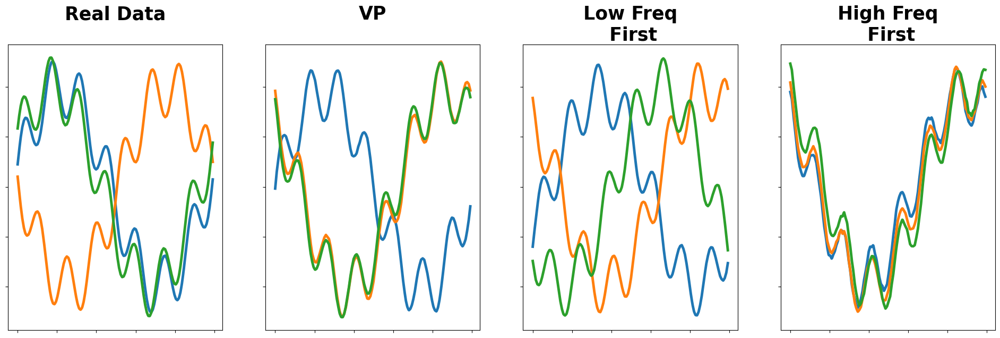

In [10]:
fig, axes = plt.subplots(1, 4, figsize=(24, 7), sharey=True)
n_gen_to_plot = 3
fd[:n_gen_to_plot].plot(axes=axes[0], lw=3.5, label="Original data")
vp_generator_generated[:n_gen_to_plot].plot(axes=axes[1], lw=3.5,label="Equal Decay ~ VP")
generator_1_generated[:n_gen_to_plot].plot(axes=axes[2], lw=3.5, label="Low Frequency Decay First")
generator_2_generated[:n_gen_to_plot].plot(axes=axes[3], lw=3.5, label="High Frequency Decay First")
axes[0].set_title("Real Data\n", fontsize=25, fontweight="bold")
axes[1].set_title("VP\n", fontsize=25, fontweight="bold")
axes[2].set_title("Low Freq\n First", fontsize=25, fontweight="bold")
axes[3].set_title("High Freq\n First", fontsize=25, fontweight="bold")
for ax in axes:
    ax.tick_params(axis='both', labelbottom=False, labelleft=False)

plt.show()



In [11]:
def get_cosine_basis(M: int ) -> np.ndarray:
    """Computes the cosine basis for a given size M.

    The cosine basis is an orthogonal matrix that diagonalizes
    circulant symmetric matrices. It has the following structure:
        c_0  c_1  c_2 ... c_(M/2) c_(M/2-1) ... c_2 c_1
        c_1  c_0  c_1   c_2  ... c_(M/2-1)  c_(M/2) ... c_3  c_2
        .
        .
        .
        c_2 c_3 ... c_(M/2) c_(M/2-1) ... c_2 c_1
        c_1  c_2  c_3   c_4  ... c_(M/2)  c_(M/2-1) ... c_1  c_0

    where the first column is the DC component, the next columns are the harmonic frequencies,
    and if M is even, the middle column is the Nyquist frequency.

    Args:
        M: The size of the matrix.
        device: The device on which to create the matrix. Default is 'cpu'.
    Returns:
        Q: The real part of the Fourier basis, shape (M, M).
    """
    # Ensure M is an integer tensor for calculations
    
    indices = np.arange(M)

    Q = np.zeros((M, M))

    # --- 1. DC Component (k=0) ---
    # Corresponds to lambda[0]
    Q[:, 0] = 1.0 / np.sqrt(M)

    # --- 2. Harmonic Frequencies (Pairs) ---
    # We iterate k from 1 up to (M-1)//2.
    # This generates matching pairs at columns k and M-k.
    # Example M=8: k=1, 2, 3. (Cols 1&7, 2&6, 3&5 filled).
    # Example M=9: k=1, 2, 3, 4. (Cols 1&8, 2&7, 3&6, 4&5 filled).

    limit = (M - 1) // 2
    if limit > 0:
        k_vals = np.arange(1, limit + 1)
        # Outer product: indices (rows) x k_vals (freqs)
        # Shape: (M, num_freqs)
        angles = (2 * torch.pi * indices[:, np.newaxis] * k_vals[np.newaxis, :]) / M
        # Flip angles son M-1 is filled with k=1, M-2 with k=2, etc.
        flip_angles = np.flip(angles, axis=1)

        normalization = np.sqrt(2.0 / M)

        # Fill the 'left' side (k) with Cosines
        Q[:, 1:limit+1] = normalization * np.cos(angles)

        # Fill the 'right' side (M-k) with Sines
        # We map k=1 to col M-1, k=2 to col M-2, etc.
        Q[:, M - limit:] = normalization * np.sin(flip_angles)

    # --- 3. Nyquist Component (k=M/2) ---
    # Only exists if M is even. Corresponds to lambda[M/2].
    if M % 2 == 0:
        # This is the alternating vector [1, -1, 1, -1...]
        Q[:, M // 2] = np.cos(np.pi * indices) / np.sqrt(M)
    return Q



Evaluating frequency model...


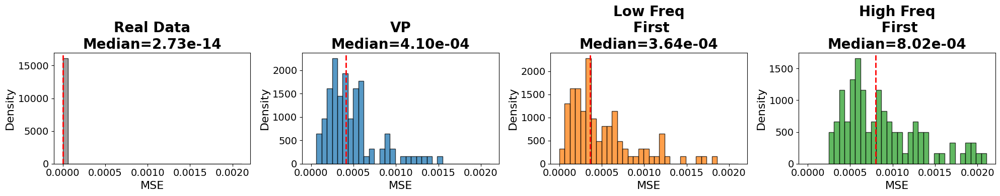

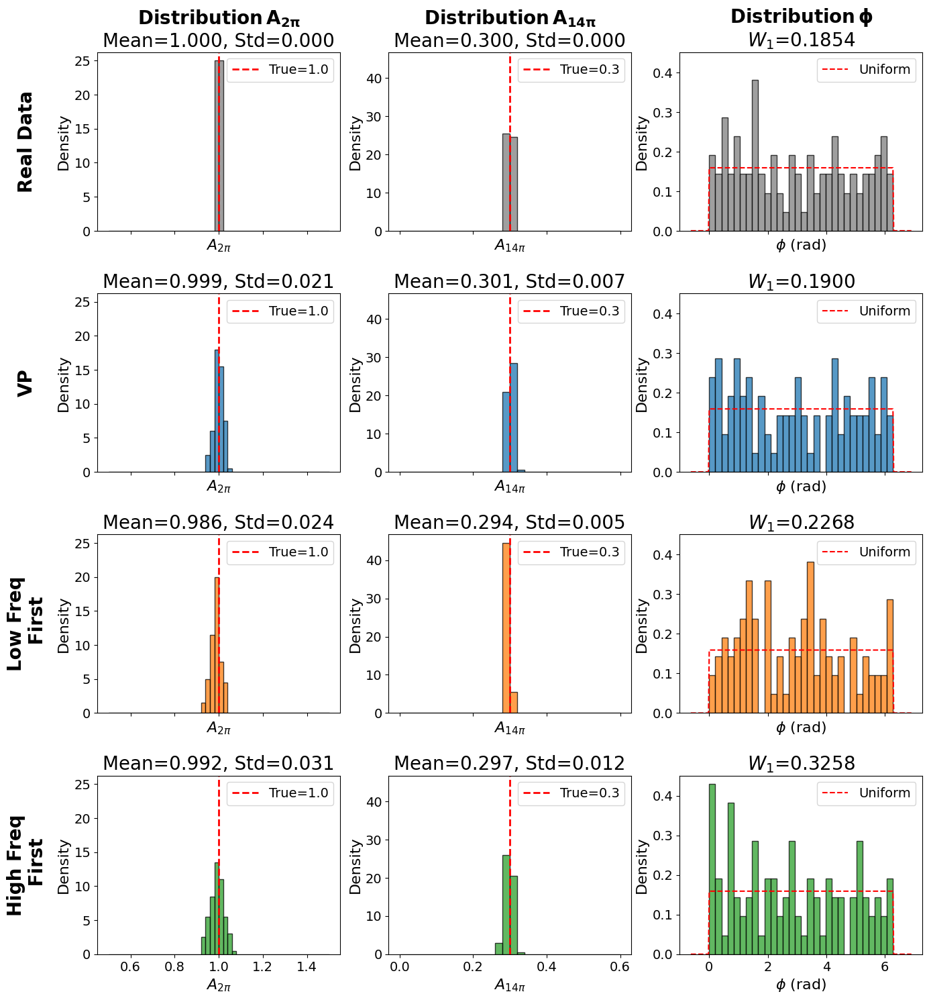

In [12]:
from scipy.optimize import minimize
from scipy.stats import wasserstein_distance, iqr


def recover_params_frequency(fd_gen, freq_small=1, freq_big=7,
                              n_restarts=10, param_bounds=None, seed=0):
    """
    For each function fit A1, A7, phi minimising MSE for
      A1*cos(2*pi*freq_small*t + phi) + A7*cos(2*pi*freq_big*t + phi).
    Both components share phi. Stratified restarts on phi (periodic non-convexity).
    Returns: params (N, 3) as [A1, A7, phi], mses (N,)
    """
    if param_bounds is None:
        param_bounds = [(0.0, 1.5), (0.0, 0.6), (0.0, 2 * np.pi)]
    rng = np.random.RandomState(seed)
    y = fd_gen.data_matrix.squeeze(-1)
    t = fd_gen.grid_points[0]
    N = y.shape[0]
    params, mses = np.zeros((N, 3)), np.zeros(N)

    def obj(theta, y_i):
        A1, A7, phi = theta
        pred = A1 * np.cos(2 * np.pi * freq_small * t + phi) \
             + A7 * np.cos(2 * np.pi * freq_big * t + phi)
        return np.mean((y_i - pred) ** 2)

    phi_guesses = np.linspace(*param_bounds[2], n_restarts, endpoint=False)

    for i in range(N):
        best_mse, best_theta = np.inf, None
        for j in range(n_restarts):
            theta0 = np.array([rng.uniform(lo, hi) for lo, hi in param_bounds])
            theta0[2] = phi_guesses[j]
            res = minimize(obj, theta0, args=(y[i],), method='L-BFGS-B',
                           bounds=param_bounds, options={'maxiter': 200, 'ftol': 1e-10})
            if res.fun < best_mse:
                best_mse, best_theta = res.fun, res.x.copy()
        if best_theta[0] < 0:
            best_theta[0] = -best_theta[0]
            best_theta[2] = (best_theta[2] + np.pi) % (2 * np.pi)
        params[i], mses[i] = best_theta, best_mse
    return params, mses


def evaluate_frequency_model(
    fd_original, fd_vp, fd_gen1, fd_gen2,
    freq_small, freq_big,
    A1_true=1.0, A7_true=0.3,
    phase_range=(0., 2 * np.pi),
    A1_bins=np.linspace(0.5, 1.5, 51),
    A7_bins=np.linspace(0.0, 0.6, 31),
    n_restarts=10, seed=42,
    model_names=("Real Data", "VP", "Low Freq\n First", "High Freq\n First"),
    dataset_label="Frequency Dataset",
):
    """
    Evaluates models on superimposed cosine data with shared phase.
    Recovers (A1, A7, phi) per sample via L-BFGS-B with stratified phi restarts.

    Figure 1: MSE histograms (1 row x 4 cols).
    Figure 2: 4 rows x 3 cols parameter grid (A1, A7, phi).
      - A1, A7: fixed bins + shared y-axis per column so the real-data spike towers
                over spread generated distributions for easy visual comparison.
      - phi:    Uniform reference line + W1 distance.
    """
    fds = [fd_original, fd_vp, fd_gen1, fd_gen2]
    colors = ['tab:gray', 'tab:blue', 'tab:orange', 'tab:green']

    param_bounds = [(0.0, 1.5), (0.0, 0.6), phase_range]
    recovered, mses_dict = {}, {}
    for name, fd_item in zip(model_names, fds):
        p, m = recover_params_frequency(
            fd_item, freq_small=freq_small, freq_big=freq_big,
            n_restarts=n_restarts, param_bounds=param_bounds, seed=seed,
        )
        recovered[name], mses_dict[name] = p, m

    results = {}

    # Figure 1: MSE histograms
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))

    all_mse = np.concatenate(list(mses_dict.values()))
    bins_mse = np.linspace(0, np.percentile(all_mse, 98) * 1.1, 35)
    for ax, name, color in zip(axes, model_names, colors):
        med, iq = np.median(mses_dict[name]), iqr(mses_dict[name])
        ax.hist(mses_dict[name], bins=bins_mse, density=True, alpha=0.75,
                color=color, edgecolor='black')
        ax.axvline(med, color='red', linestyle='--', linewidth=2)
        ax.set_title(f'{name}\nMedian={med:.2e}', fontsize=20, fontweight='bold')
        ax.set_ylabel('Density', fontsize=16)
        ax.set_xlabel('MSE', fontsize=16)
        ax.tick_params(axis='both', labelsize=14)
        results[f'{name}_median_mse'] = float(med)
        results[f'{name}_iqr_mse'] = float(iq)
    plt.tight_layout()

    plt.show()

    # Figure 2: 4 x 3 parameter grid
    # Fixed bins for A1/A7 so all rows use the same x-range and bin width.
    # sharey='col' lets the tall real-data spike set the scale, making it
    # immediately visible how much more spread the generated distributions are.
    phi_bins = np.linspace(*phase_range, 31)
    ideal_N = 5000
    fig, axes = plt.subplots(4, 3, figsize=(15, 16), sharey='col', sharex='col')

    col_titles = [r'Distribution $A_{2\pi}$', r'Distribution $A_{14\pi}$', r'Distribution $\phi$']

    for col, col_title in enumerate(col_titles):
        axes[0, col].set_title(col_title, fontsize=20, fontweight='bold', pad=10)

    for row, (name, color) in enumerate(zip(model_names, colors)):
        p = recovered[name]

        # Col 0 — A1
            # Col 0 — A1
        ax = axes[row, 0]
        ax.hist(p[:, 0], bins=A1_bins, density=True, alpha=0.75, color=color, edgecolor='black')
        ax.axvline(A1_true, color='red', linestyle='--', linewidth=2, label=f'True={A1_true}')
        mu, sig = p[:, 0].mean(), p[:, 0].std()
        title_a1 = (r'$\bf{Distribution}\,A_{2\pi}$' + f'\nMean={mu:.3f}, Std={sig:.3f}') if row == 0 else f'Mean={mu:.3f}, Std={sig:.3f}'
        ax.set_title(title_a1, fontsize=20)        
        
        ax.set_xlabel(r'$A_{2\pi}$',fontsize=16)
        ax.set_ylabel('Density', fontsize=16)
        ax.legend(fontsize=14)
        ax.tick_params(axis='both', labelsize=14)
        results[f'{name}_A1_mean'] = float(mu)
        results[f'{name}_A1_std']  = float(sig)

        # Col 1 — A7
        ax = axes[row, 1]
        ax.hist(p[:, 1], bins=A7_bins, density=True, alpha=0.75, color=color, edgecolor='black')
        ax.axvline(A7_true, color='red', linestyle='--', linewidth=2, label=f'True={A7_true}')
        mu7, sig7 = p[:, 1].mean(), p[:, 1].std()
        title_a7 = (r'$\bf{Distribution}\, A_{14\pi}$' + f'\nMean={mu7:.3f}, Std={sig7:.3f}') if row == 0 else f'Mean={mu7:.3f}, Std={sig7:.3f}'       
        ax.set_title(title_a7, fontsize=20)
        ax.set_xlabel(r'$A_{14\pi}$', fontsize=16)
        ax.set_ylabel('Density', fontsize=16)
        ax.legend(fontsize=14)
        ax.tick_params(axis='both', labelsize=14)
        results[f'{name}_A7_mean'] = float(mu7)
        results[f'{name}_A7_std']  = float(sig7)

        # Col 2 — phi
        ax = axes[row, 2]
        lo, hi = phase_range
        ax.hist(p[:, 2], bins=phi_bins, density=True, alpha=0.75, color=color, edgecolor='black')
        xr = np.linspace(lo - 0.1 * (hi - lo), hi + 0.1 * (hi - lo), 300)
        ax.plot(xr, np.where((xr >= lo) & (xr <= hi), 1 / (hi - lo), 0),
                'r--', linewidth=1.5, label='Uniform')
        ideal = np.linspace(lo, hi, ideal_N)
        w1 = wasserstein_distance(p[:, 2], ideal)
        title_phi = (r'$\bf{Distribution} \, \phi$' + f'\n$W_1$={w1:.4f}') if row == 0 else f'$W_1$={w1:.4f}'   
        ax.set_title(title_phi, fontsize=20)
        ax.set_xlabel(r'$\phi$ (rad)', fontsize=16)
        ax.set_ylabel('Density', fontsize=16)
        ax.legend(fontsize=14)
        ax.tick_params(axis='both', labelsize=14)
        results[f'{name}_W1_phi'] = float(w1)

    fig.subplots_adjust(left=0.08, top=0.95, hspace=0.35)
    fig.canvas.draw()  # fuerza el layout antes de calcular posiciones

    for row, name in enumerate(model_names):
        row_y = (axes[row, 0].get_position().y0 + axes[row, 0].get_position().y1) / 2
        fig.text(0.01, row_y, name, va='center', ha='center',
                fontsize=20, fontweight='bold', rotation=90)
    plt.show()
    return results


# ==========================================
# EXECUTION
# ==========================================
print("Evaluating frequency model...")
results_freq = evaluate_frequency_model(
    fd_original=fd[:n_gen_samples],
    fd_vp=vp_generator_generated,
    fd_gen1=generator_1_generated,
    fd_gen2=generator_2_generated,
    freq_small=frequency_small,
    freq_big=frequency_big,
    A1_true=1.0,
    A7_true=0.3,
    phase_range=phase_range,
    n_restarts=10,
    dataset_label="Frequency Dataset",
)

## Evaluating the Results

The plots above recover three parameters per generated sample by fitting the shared-phase model $A_1\cos(2\pi t + \phi) + A_7\cos(14\pi t + \phi)$ via L-BFGS-B with stratified restarts on $\phi$.

**MSE** measures how closely each generated function matches its best-fitting parametrized form — lower is better. 

**Amplitude panels** ($A_1$, $A_7$) show whether the generator reproduces the correct constant amplitudes (true values: 1.0 and 0.3; the dashed red line marks the target). 

**Phase panel** ($\phi$) shows whether the generator reproduces the $\mathcal{U}(0, 2\pi)$ distribution; $W_1$ quantifies the deviation from uniform.